In [1]:
import matplotlib
import matplotlib.pyplot as plt
print(matplotlib.__version__)
print(matplotlib.get_data_path())  # agora deve existir


3.9.2
c:\Users\vieir\Mestrado\TESE\tese\Lib\site-packages\matplotlib\mpl-data


In [2]:
import pandas as pd

In [3]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import re


In [4]:
from textblob import TextBlob
from vaderSentiment.vaderSentiment import SentimentIntensityAnalyzer
import transformers
from transformers import pipeline
import nltk
from nltk.corpus import stopwords
# Baixar as stop words do nltk
nltk.download('stopwords')
stop_words = set(stopwords.words('english'))

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\vieir\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [5]:
import emoji
import demoji
 
demoji.download_codes()

C:\Users\vieir\AppData\Local\Temp\ipykernel_4916\4279647861.py:4: FutureWarning: The demoji.download_codes attribute is deprecated and will be removed from demoji in a future version. It is an unused attribute as emoji codes are now distributed directly with the demoji package.
  demoji.download_codes()


In [6]:
from functions import *

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\vieir\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
c:\Users\vieir\Mestrado\TESE\pipeline\functions.py:22: FutureWarning: The demoji.download_codes attribute is deprecated and will be removed from demoji in a future version. It is an unused attribute as emoji codes are now distributed directly with the demoji package.
  demoji.download_codes()


In [7]:
pd.set_option('display.max_columns', None)  # Para mostrar todas as colunas
# pd.set_option('display.max_rows', None)
pd.set_option('display.max_colwidth', None)  # Para permitir que as colunas sejam exibidas sem corte

### Import datasets and concatenate 

In [8]:
df_fake1 = pd.read_csv(r'C:\Users\vieir\Mestrado\TESE\tweets\analises\df_fake_news.csv')


In [9]:
df_fake2 = pd.read_csv(r'C:\Users\vieir\Mestrado\TESE\tweets\novos fake\dicionario\merged_df.csv')

In [10]:
df_true = pd.read_csv(r'C:\Users\vieir\Mestrado\TESE\tweets_true\analises\merged_df_true.csv')


In [11]:
df_fake1['categoria'].unique()

array(['Pseudoscience', 'Political News', 'Religious Advocacy',
       'General News', 'Imposter Pink Slime', 'Conspiracy',
       'PAC SuperPAC'], dtype=object)

In [12]:
df_fake2['categoria'].unique()

array(['Political Advocacy'], dtype=object)

In [13]:
# eliminar os dados das categorias: Imposter Pink Slime, Religious Advocacy.
parte1_com_exclusoes = df_fake1[~df_fake1['categoria'].isin(['Imposter Pink Slime', 'Religious Advocacy'])]

In [14]:
parte2 = df_fake2.copy()

In [15]:
df_fake = pd.concat([parte1_com_exclusoes, parte2], ignore_index=True)


In [16]:
df_fake['classification'] = 'fake news'
df_true['classification'] = 'reliable news'

In [17]:
df = pd.concat([df_fake, df_true], ignore_index=True)

In [18]:
df = df.rename(columns={'nome': 'name', 'n seguidores': 'n followers', 'categoria': 'category', 'usuario': 'user', 'usuario_id': 'user_id'})

In [19]:
non_string_texts = df[~df['text'].apply(lambda x: isinstance(x, str))]
non_string_texts

,tweet_id,text,language,type,bookmark_count,favorite_count,retweet_count,reply_count,view_count,created_at,client,hashtags,urls,media_type,media_urls,user_id,name,n tweets,n followers,category,Factual Reporting,user,classification
52369,'',NaN,NaN,Tweet,NaN,NaN,NaN,NaN,NaN,2025-01-11 11:48:11,NaN,NaN,NaN,NaN,NaN,ADL,Anti-Defamation League,994.0,336968.0,Political Advocacy,high,ADL,reliable news


In [20]:
df = df.dropna(subset=['text'])

In [21]:
df.to_csv(r'df_all_without_cleaning.csv', index=False)

In [22]:
df = pd.read_csv(r'df_all_without_cleaning.csv')

### emoji treatment 

#### emoji count

In [23]:
df['emoji_count'] = df['text'].apply(emoji_count)

#### emoji replacement

In [24]:
df['text_clean'] = df['text'].apply(replace_emojis_with_descriptions)

In [25]:
df[df['emoji_count']!=0].head(2)

,tweet_id,text,language,type,bookmark_count,favorite_count,retweet_count,reply_count,view_count,created_at,client,hashtags,urls,media_type,media_urls,user_id,name,n tweets,n followers,category,Factual Reporting,user,classification,emoji_count,text_clean
168,'1852736426816794736',"🔥 Live Now on CIVL: Art of Liberty Foundation’s FREE Livestream 🔥\nGet ready to experience a seismic shift in how we view society, governance, and personal freedom. Thanks to a powerful sponsorship, this revolutionary livestream is free!\nTune in: https://t.co/iJCscu5zJT https://t.co/atdeGa9Oer",en,Tweet,0.0,0.0,0.0,0.0,215.0,2024-11-02 15:36:00,"<a href=""https://mobile.twitter.com"" rel=""nofollow"">Twitter Web App</a>",NaN,https://watch.civl.com/programs/liberty-on-the-rocks-2024-digital-pass,photo,https://pbs.twimg.com/media/GbY90Rsa8AArRjk.jpg,ActivistPost,Activist Post,1000.0,41070.0,Pseudoscience,low,ActivistPost,fake news,2,",fire, Live Now on CIVL: Art of Liberty Foundation’s FREE Livestream ,fire,\nGet ready to experience a seismic shift in how we view society, governance, and personal freedom. Thanks to a powerful sponsorship, this revolutionary livestream is free!\nTune in: https://t.co/iJCscu5zJT https://t.co/atdeGa9Oer"
177,'1852114998023057555',"👀 Ready to see what true liberty looks like? The Art of Liberty Foundation’s livestream is live today, free on CiVL! Experience game-changing ideas on society, governance, and freedom—no charge, no filters. \n\n🌐 Tap in: \n\nhttps://t.co/iJCscu5zJT https://t.co/PYN81JyTBW",en,Tweet,0.0,1.0,1.0,0.0,201.0,2024-10-31 22:26:40,"<a href=""https://mobile.twitter.com"" rel=""nofollow"">Twitter Web App</a>",NaN,https://watch.civl.com/programs/liberty-on-the-rocks-2024-digital-pass,photo,https://pbs.twimg.com/media/GbQIxEvXgAAavLl.jpg,ActivistPost,Activist Post,1000.0,41070.0,Pseudoscience,low,ActivistPost,fake news,2,",eyes, Ready to see what true liberty looks like? The Art of Liberty Foundation’s livestream is live today, free on CiVL! Experience game-changing ideas on society, governance, and freedom—no charge, no filters. \n\n,globe with meridians, Tap in: \n\nhttps://t.co/iJCscu5zJT https://t.co/PYN81JyTBW"


### clening tweets 
- exclude hashtags and links 
- exclude stop words to plot word cloud

In [26]:
df['text_clean'] = df['text_clean'].apply(clean_tweet)
df['text_clean_sw'] = df['text_clean'].apply(clean_text)

In [27]:
df[df['emoji_count']!=0].head(2)

,tweet_id,text,language,type,bookmark_count,favorite_count,retweet_count,reply_count,view_count,created_at,client,hashtags,urls,media_type,media_urls,user_id,name,n tweets,n followers,category,Factual Reporting,user,classification,emoji_count,text_clean,text_clean_sw
168,'1852736426816794736',"🔥 Live Now on CIVL: Art of Liberty Foundation’s FREE Livestream 🔥\nGet ready to experience a seismic shift in how we view society, governance, and personal freedom. Thanks to a powerful sponsorship, this revolutionary livestream is free!\nTune in: https://t.co/iJCscu5zJT https://t.co/atdeGa9Oer",en,Tweet,0.0,0.0,0.0,0.0,215.0,2024-11-02 15:36:00,"<a href=""https://mobile.twitter.com"" rel=""nofollow"">Twitter Web App</a>",NaN,https://watch.civl.com/programs/liberty-on-the-rocks-2024-digital-pass,photo,https://pbs.twimg.com/media/GbY90Rsa8AArRjk.jpg,ActivistPost,Activist Post,1000.0,41070.0,Pseudoscience,low,ActivistPost,fake news,2,",fire, Live Now on CIVL: Art of Liberty Foundation’s FREE Livestream ,fire, Get ready to experience a seismic shift in how we view society, governance, and personal freedom. Thanks to a powerful sponsorship, this revolutionary livestream is free! Tune in:",",fire, Live CIVL: Art Liberty Foundation’s FREE Livestream ,fire, Get ready experience seismic shift view society, governance, personal freedom. Thanks powerful sponsorship, revolutionary livestream free! Tune in:"
177,'1852114998023057555',"👀 Ready to see what true liberty looks like? The Art of Liberty Foundation’s livestream is live today, free on CiVL! Experience game-changing ideas on society, governance, and freedom—no charge, no filters. \n\n🌐 Tap in: \n\nhttps://t.co/iJCscu5zJT https://t.co/PYN81JyTBW",en,Tweet,0.0,1.0,1.0,0.0,201.0,2024-10-31 22:26:40,"<a href=""https://mobile.twitter.com"" rel=""nofollow"">Twitter Web App</a>",NaN,https://watch.civl.com/programs/liberty-on-the-rocks-2024-digital-pass,photo,https://pbs.twimg.com/media/GbQIxEvXgAAavLl.jpg,ActivistPost,Activist Post,1000.0,41070.0,Pseudoscience,low,ActivistPost,fake news,2,",eyes, Ready to see what true liberty looks like? The Art of Liberty Foundation’s livestream is live today, free on CiVL! Experience game changing ideas on society, governance, and freedom no charge, no filters. ,globe with meridians, Tap in:",",eyes, Ready see true liberty looks like? Art Liberty Foundation’s livestream live today, free CiVL! Experience game changing ideas society, governance, freedom charge, filters. ,globe meridians, Tap in:"


In [28]:
df = df.dropna(subset=['text_clean'])

### Sentiment Classification

#### using textblob

In [29]:
df['sentiment_textblob'] = df['text_clean'].apply(lambda x: classify_sentiment_textblob(x))

In [30]:
df[df['emoji_count']!=0].head(2)

,tweet_id,text,language,type,bookmark_count,favorite_count,retweet_count,reply_count,view_count,created_at,client,hashtags,urls,media_type,media_urls,user_id,name,n tweets,n followers,category,Factual Reporting,user,classification,emoji_count,text_clean,text_clean_sw,sentiment_textblob
168,'1852736426816794736',"🔥 Live Now on CIVL: Art of Liberty Foundation’s FREE Livestream 🔥\nGet ready to experience a seismic shift in how we view society, governance, and personal freedom. Thanks to a powerful sponsorship, this revolutionary livestream is free!\nTune in: https://t.co/iJCscu5zJT https://t.co/atdeGa9Oer",en,Tweet,0.0,0.0,0.0,0.0,215.0,2024-11-02 15:36:00,"<a href=""https://mobile.twitter.com"" rel=""nofollow"">Twitter Web App</a>",NaN,https://watch.civl.com/programs/liberty-on-the-rocks-2024-digital-pass,photo,https://pbs.twimg.com/media/GbY90Rsa8AArRjk.jpg,ActivistPost,Activist Post,1000.0,41070.0,Pseudoscience,low,ActivistPost,fake news,2,",fire, Live Now on CIVL: Art of Liberty Foundation’s FREE Livestream ,fire, Get ready to experience a seismic shift in how we view society, governance, and personal freedom. Thanks to a powerful sponsorship, this revolutionary livestream is free! Tune in:",",fire, Live CIVL: Art Liberty Foundation’s FREE Livestream ,fire, Get ready experience seismic shift view society, governance, personal freedom. Thanks powerful sponsorship, revolutionary livestream free! Tune in:",positive
177,'1852114998023057555',"👀 Ready to see what true liberty looks like? The Art of Liberty Foundation’s livestream is live today, free on CiVL! Experience game-changing ideas on society, governance, and freedom—no charge, no filters. \n\n🌐 Tap in: \n\nhttps://t.co/iJCscu5zJT https://t.co/PYN81JyTBW",en,Tweet,0.0,1.0,1.0,0.0,201.0,2024-10-31 22:26:40,"<a href=""https://mobile.twitter.com"" rel=""nofollow"">Twitter Web App</a>",NaN,https://watch.civl.com/programs/liberty-on-the-rocks-2024-digital-pass,photo,https://pbs.twimg.com/media/GbQIxEvXgAAavLl.jpg,ActivistPost,Activist Post,1000.0,41070.0,Pseudoscience,low,ActivistPost,fake news,2,",eyes, Ready to see what true liberty looks like? The Art of Liberty Foundation’s livestream is live today, free on CiVL! Experience game changing ideas on society, governance, and freedom no charge, no filters. ,globe with meridians, Tap in:",",eyes, Ready see true liberty looks like? Art Liberty Foundation’s livestream live today, free CiVL! Experience game changing ideas society, governance, freedom charge, filters. ,globe meridians, Tap in:",positive


#### using vader

In [31]:
sentiment = SentimentIntensityAnalyzer()

In [32]:
df['sentiment_vader'] = df['text_clean'].apply(lambda x: classify_sentiment_vader(sentiment.polarity_scores(x)))


In [33]:
df.to_csv(r'df_sentiment_vader_textblob.csv', index=False)

#### using Transformer based models

The implementation of this part can be found in the notebook 01_sentimental_analysis_transformers.ipynb :)

In [34]:
df_sentiment = pd.read_csv(r'C:\Users\vieir\Mestrado\TESE\pipeline\resultados\df_all_sentiment_tensor.csv')

### Emoticon Recognition

The implementation of this part can be found in the notebook 02_emoticon_recognition.ipynb :)

In [35]:
df_all = pd.read_csv(r'resultados\df_all_emoticon_seq.csv')


### Preparing data for visualization

In [54]:
df_all['text_clean'] = df_all['text_clean'].str.replace(r'&amp', 'and', regex=True)

In [55]:
df_all['text_clean_sw'] = df_all['text_clean'].apply(clean_text)

In [ ]:
def clean_text(text):
    # Remove stop words
    text = ' '.join([word for word in text.split() if word.lower() not in stop_words])
    return text

In [ ]:
# Remove the word "RT" from all entries in the 'text_clean_sw' column
df_all['text_clean_sw'] = df_all['text_clean_sw'].str.replace(r'\bRT\b', '', regex=True)

# Replace all occurrences of "U.S." and "u.s." with "US"
df_all['text_clean_sw'] = df_all['text_clean_sw'].str.replace(r'\bU.S.\b', 'US', regex=True)

# Remove isolated "s" and "u" characters (uppercase or lowercase) surrounded by spaces
df_all['text_clean_sw'] = df_all['text_clean_sw'].str.replace(r'\s+[SsUu]\s+', ' ', regex=True)


In [61]:
# contar o n+umero de reliable and fake news
classification_counts = df_all['classification'].value_counts()
classification_counts

classification
reliable news    49536
fake news        45060
Name: count, dtype: int64

In [ ]:
df_all.loc[df_all['user_id'] == 'BioMedCentral', ['name', 'n tweets', 'n followers', 
                                           'category', 'Factual Reporting', 'user']] = [
    'BMC', 1000, 76613, 'Pro-Science', 'high', 'BioMedCentral']

In [62]:
df_filtred_fake = df_all[df_all['classification'] == 'fake news']
df_filtred_true = df_all[df_all['classification'] == 'reliable news']

In [63]:
r_pallet = ['#004B23', '#006400', '#007200', '#008000', '#38B000', "#AFE974FF", '#9EF01A', '#CCFF33', '#D5FF57']
f_pallet = ['#2F080E', '#5A111B', '#851A29', '#AF2336', '#DA2C43', '#E15366', '#E87A89', '#EEA2AB', '#F5C9CE']

### Visualizations

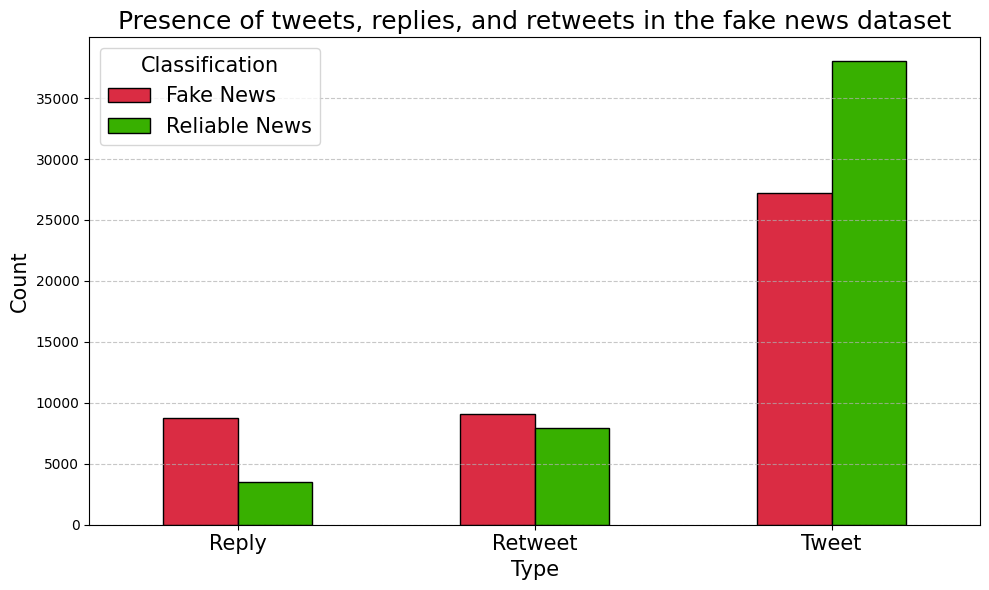

In [ ]:
type_classification_counts = df_all.groupby(['type', 'classification']).size().unstack(fill_value=0)

type_classification_counts.plot(kind='bar', figsize=(10, 6), color=[f_pallet[4], r_pallet[4]], edgecolor='black')

plt.title('Presence of tweets, replies, and retweets in the fake news dataset', fontsize=18)
plt.xlabel('Type', fontsize=15)
plt.ylabel('Count', fontsize=15)
plt.xticks(rotation=0, ha='center', fontsize=15)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.legend(title='Classification', labels=['Fake News', 'Reliable News'], title_fontsize=15, fontsize=15)

plt.tight_layout()
plt.show()

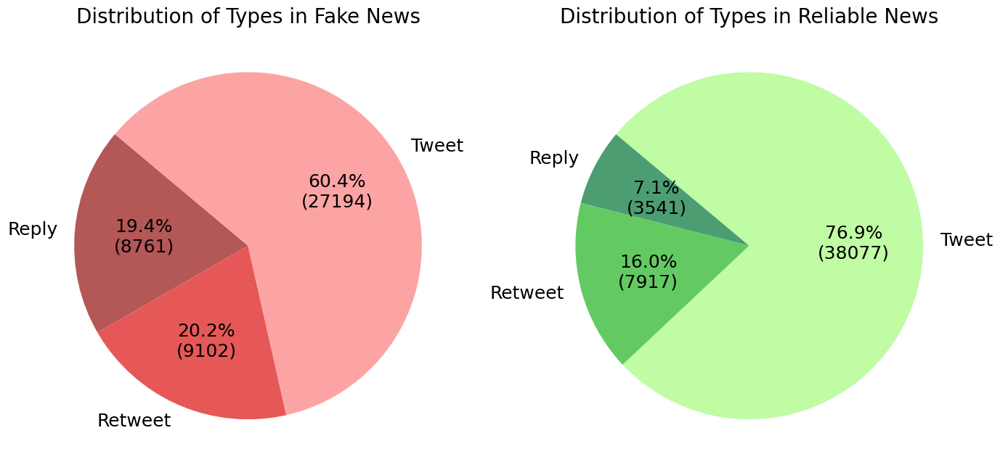

In [ ]:
type_classification_counts = df_all.groupby(['type', 'classification']).size().unstack(fill_value=0)

fake_counts = type_classification_counts['fake news']
reliable_counts = type_classification_counts['reliable news']

fake_colors = ["#B45757", "#E65858",  "#FCA4A4"]
reliable_colors = ["#4C9E72", "#63CA63","#BFFCA4"]

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 7))

def func(pct, allvals):
    absolute = int(pct/100.*sum(allvals))
    return "{:.1f}%\n({:d})".format(pct, absolute)

# Fake News
wedges, texts, autotexts = ax1.pie(fake_counts, labels=fake_counts.index, colors=fake_colors, autopct=lambda pct: func(pct, fake_counts), startangle=140, textprops=dict(color="black"))
ax1.set_title('Distribution of Types in Fake News', fontsize=20)
plt.setp(autotexts, size=18)
plt.setp(texts, size=18)

# Reliable News
wedges, texts, autotexts = ax2.pie(reliable_counts, labels=reliable_counts.index, colors=reliable_colors, autopct=lambda pct: func(pct, reliable_counts), startangle=140, textprops=dict(color="black"))
ax2.set_title('Distribution of Types in Reliable News', fontsize=20)
plt.setp(autotexts, size=18)
plt.setp(texts, size=18)

plt.tight_layout()
plt.show()

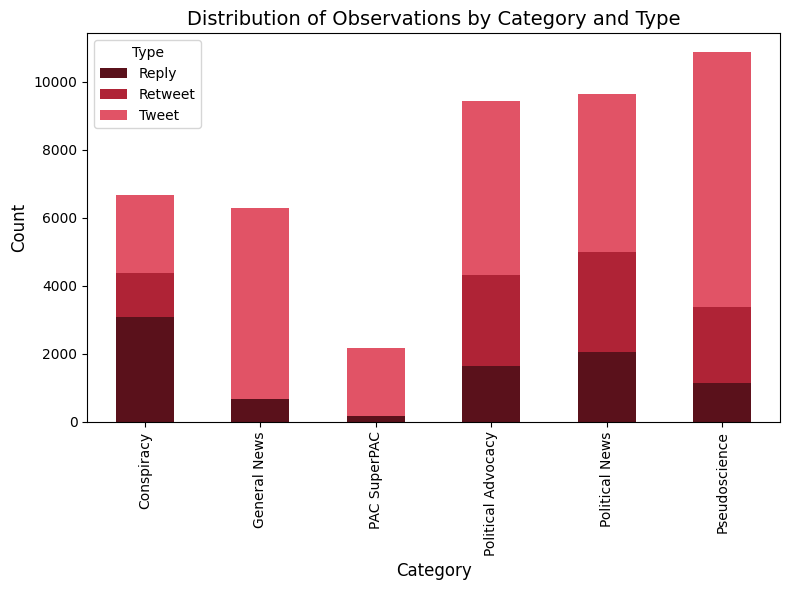

In [ ]:
counts = df_filtred_fake.groupby(['category', 'type']).size().unstack(fill_value=0)

colors = ['#5A111B', '#AF2336', '#E15366']

counts.plot(kind='bar', stacked=True, figsize=(8, 6), color=colors)

plt.title('Distribution of Observations by Category and Type', fontsize=14)
plt.xlabel('Category', fontsize=12)
plt.ylabel('Count', fontsize=12)
plt.legend(title='Type')
plt.tight_layout()
plt.show()

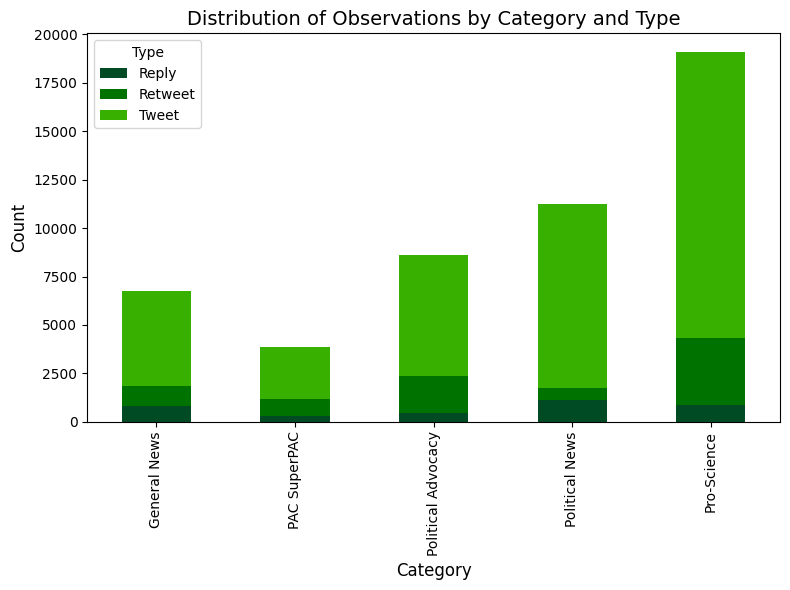

In [ ]:
counts = df_filtred_true.groupby(['category', 'type']).size().unstack(fill_value=0)

colors = reliable_colors

counts.plot(kind='bar', stacked=True, figsize=(8, 6), color=colors)

plt.title('Distribution of Observations by Category and Type', fontsize=14)
plt.xlabel('Category', fontsize=12)
plt.ylabel('Count', fontsize=12)
plt.legend(title='Type')
plt.tight_layout() 
plt.show()

### sentimentos

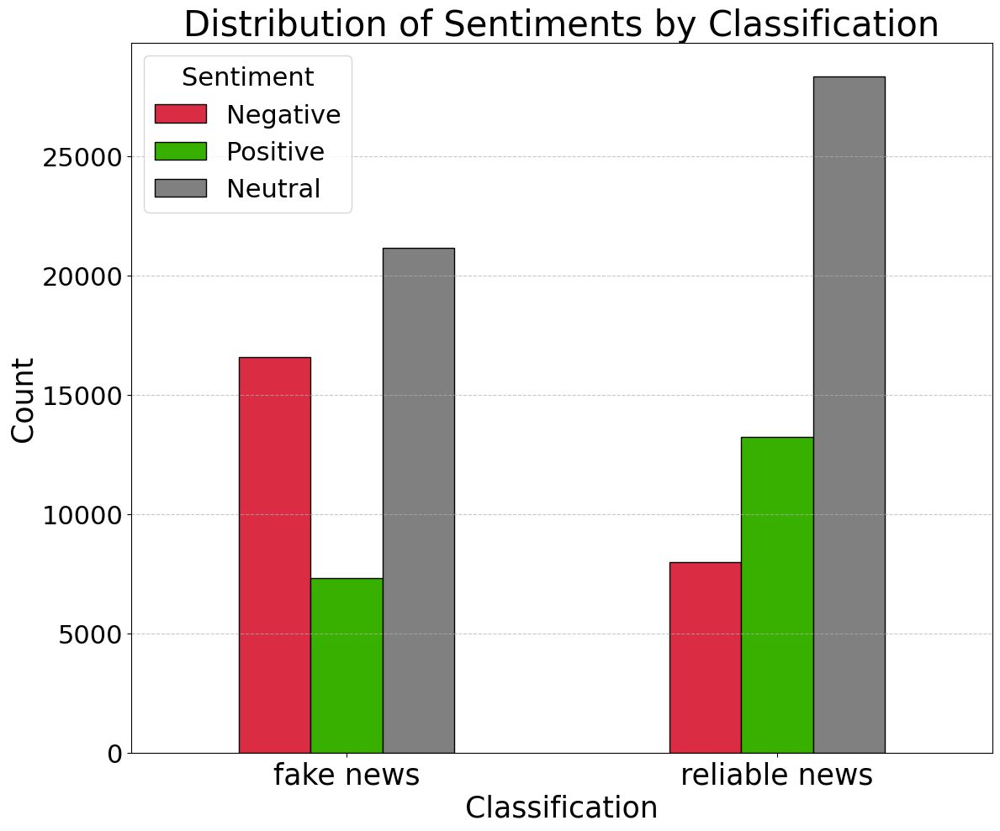

In [ ]:
sentiment_classification_counts = df_all.groupby(['classification', 'sentiment_transformers']).size().unstack(fill_value=0)

sentiment_classification_counts = sentiment_classification_counts[['negative', 'positive', 'neutral']]

colors = [f_pallet[4], '#38B000', 'gray']

ax = sentiment_classification_counts.plot(kind='bar', figsize=(12, 10), edgecolor='black', color=colors)

plt.title('Distribution of Sentiments by Classification', fontsize=30)
plt.xlabel('Classification', fontsize=25)
plt.ylabel('Count', fontsize=25)
plt.xticks(rotation=0, ha='center', fontsize=25)
plt.yticks(fontsize=22)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.legend(title='Sentiment', labels=['Negative', 'Positive', 'Neutral'], title_fontsize=22, fontsize=22, loc='upper left')
plt.tight_layout()
plt.show()

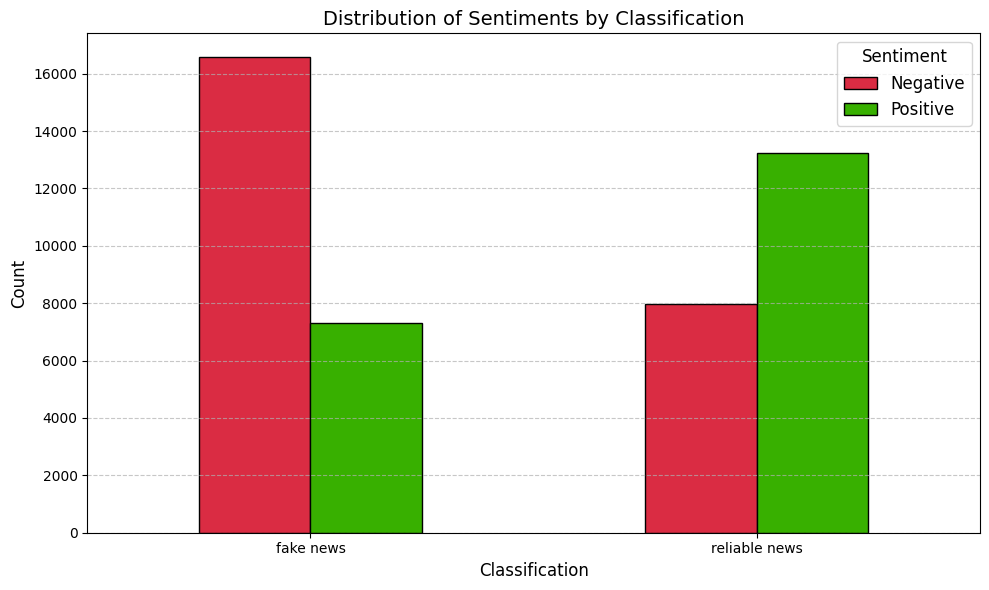

In [ ]:
sentiment_classification_counts = df_all.groupby(['classification', 'sentiment_transformers']).size().unstack(fill_value=0)

sentiment_classification_counts = sentiment_classification_counts[['negative', 'positive']]

sentiment_classification_counts.plot(kind='bar', figsize=(10, 6), edgecolor='black', color = [f_pallet[4],'#38B000'])

plt.title('Distribution of Sentiments by Classification', fontsize=14)
plt.xlabel('Classification', fontsize=12)
plt.ylabel('Count', fontsize=12)
plt.xticks(rotation=0, ha='center')
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.legend(title='Sentiment', labels=['Negative', 'Positive'], title_fontsize=12, fontsize=12)
plt.tight_layout()
plt.show()

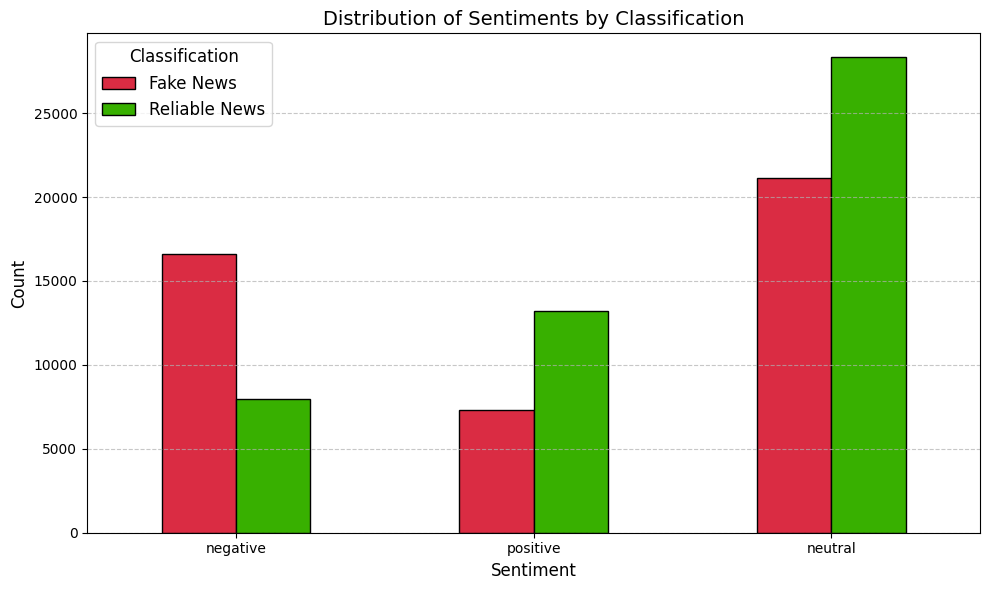

In [ ]:
type_classification_counts = df_all.groupby(['sentiment_transformers', 'classification']).size().unstack(fill_value=0)

type_classification_counts = type_classification_counts.loc[['negative', 'positive', 'neutral']]

type_classification_counts.plot(kind='bar', figsize=(10, 6), color=[f_pallet[4],'#38B000'], edgecolor='black')

plt.title('Distribution of Sentiments by Classification', fontsize=14)
plt.xlabel('Sentiment', fontsize=12)
plt.ylabel('Count', fontsize=12)
plt.xticks(rotation=0, ha='center')
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.legend(title='Classification', labels=['Fake News', 'Reliable News'], title_fontsize=12, fontsize=12)
plt.tight_layout()
plt.show()

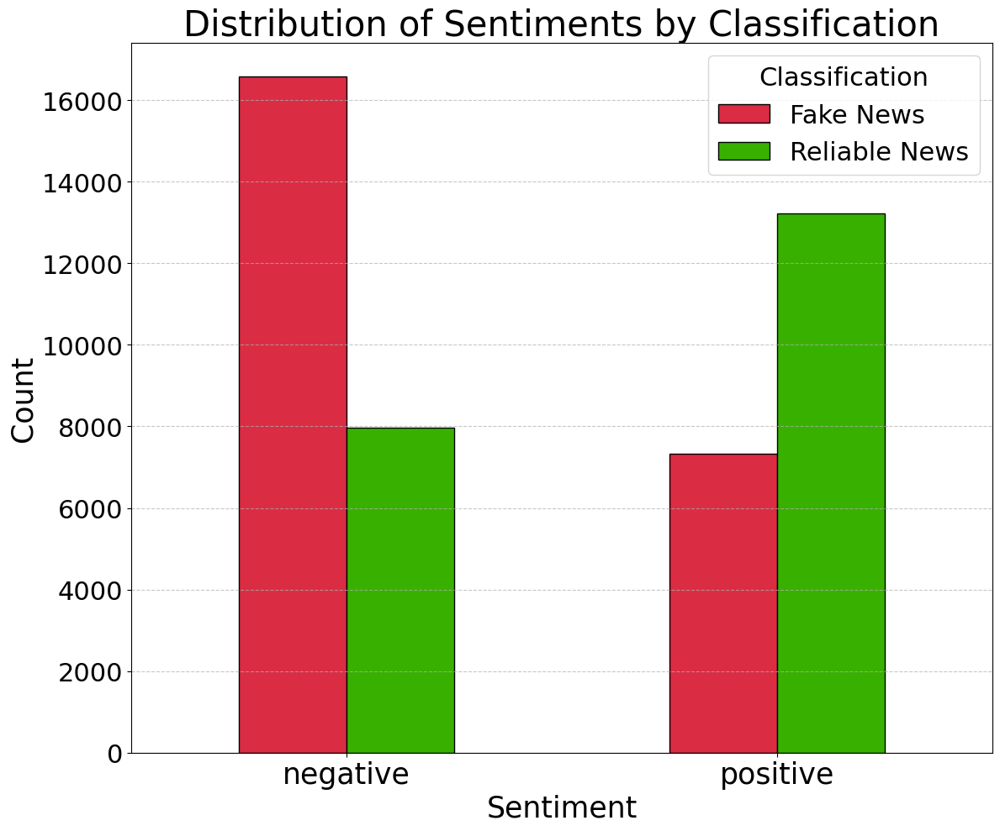

In [ ]:
type_classification_counts = df_all.groupby(['sentiment_transformers', 'classification']).size().unstack(fill_value=0)

type_classification_counts = type_classification_counts.loc[['negative', 'positive']]

type_classification_counts.plot(kind='bar', figsize=(12, 10), color=[f_pallet[4],'#38B000'], edgecolor='black')

plt.title('Distribution of Sentiments by Classification', fontsize=30)
plt.xlabel('Sentiment', fontsize=25)
plt.ylabel('Count', fontsize=25)
plt.yticks(fontsize=22)
plt.xticks(rotation=0, ha='center', fontsize=25)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.legend(title='Classification', labels=['Fake News', 'Reliable News'], title_fontsize=22, fontsize=22)
plt.tight_layout()
plt.show()

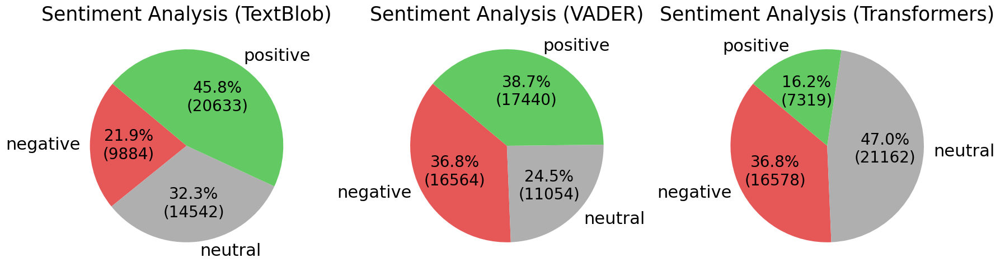

In [ ]:
textblob_counts = df_filtred_fake['sentiment_textblob'].value_counts()
vader_counts = df_filtred_fake['sentiment_vader'].value_counts()
transformers_counts = df_filtred_fake['sentiment_transformers'].value_counts()

colors = {'positive': "#63CA63", 'negative': "#E65858", 'neutral': "#AFAFAF"}

textblob_counts = textblob_counts.reindex(['negative', 'neutral', 'positive'], fill_value=0)
vader_counts = vader_counts.reindex(['negative', 'neutral', 'positive'], fill_value=0)
transformers_counts = transformers_counts.reindex(['negative', 'neutral', 'positive'], fill_value=0)

fig, axes = plt.subplots(1, 3, figsize=(18, 6))

def func(pct, allvals):
    absolute = int(pct/100.*sum(allvals))
    return "{:.1f}%\n({:d})".format(pct, absolute)

wedges, texts, autotexts = axes[0].pie(textblob_counts, labels=textblob_counts.index, colors=[colors[key] for key in textblob_counts.index], autopct=lambda pct: func(pct, textblob_counts), startangle=140, textprops=dict(color="black"))
axes[0].set_title('Sentiment Analysis (TextBlob)', fontsize=25)
plt.setp(autotexts, size=20)
plt.setp(texts, size=22)

wedges, texts, autotexts = axes[1].pie(vader_counts, labels=vader_counts.index, colors=[colors[key] for key in vader_counts.index], autopct=lambda pct: func(pct, vader_counts), startangle=140, textprops=dict(color="black"))
axes[1].set_title('Sentiment Analysis (VADER)', fontsize=25)
plt.setp(autotexts, size=20)
plt.setp(texts, size=22)

wedges, texts, autotexts = axes[2].pie(transformers_counts, labels=transformers_counts.index, colors=[colors[key] for key in transformers_counts.index], autopct=lambda pct: func(pct, transformers_counts), startangle=140, textprops=dict(color="black"))
axes[2].set_title('Sentiment Analysis (Transformers)', fontsize=25)
plt.setp(autotexts, size=20)
plt.setp(texts, size=22)

plt.tight_layout()
plt.show()

In [93]:
from wordcloud import WordCloud

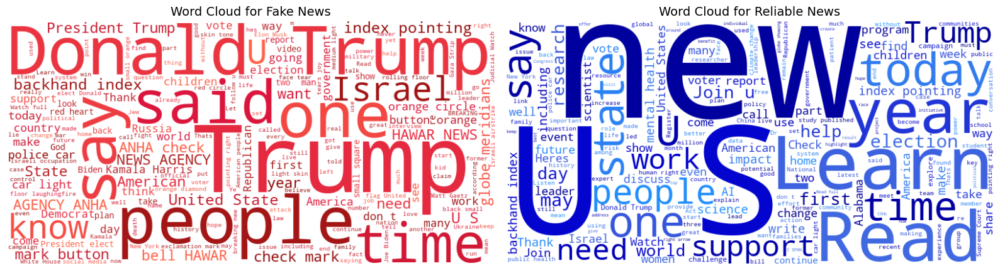

In [ ]:
from matplotlib.colors import LinearSegmentedColormap

dark_reds = LinearSegmentedColormap.from_list('dark_reds', ['#8B0000', '#B22222', '#DC143C', '#FF6347'])
dark_blues = LinearSegmentedColormap.from_list('dark_blues', ['#00008B', '#0000CD', '#4169E1', '#1E90FF'])

text_fake = ' '.join(df_filtred_fake['text_clean_sw'].dropna().astype(str))
text_true = ' '.join(df_filtred_true['text_clean_sw'].dropna().astype(str))

wordcloud_fake = WordCloud(width=800, height=400, background_color='white', colormap=dark_reds).generate(text_fake)

wordcloud_true = WordCloud(width=800, height=400, background_color='white', colormap=dark_blues).generate(text_true)

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 8))

ax1.imshow(wordcloud_fake, interpolation='bilinear')
ax1.set_title('Word Cloud for Fake News', fontsize=14)
ax1.axis('off')

ax2.imshow(wordcloud_true, interpolation='bilinear')
ax2.set_title('Word Cloud for Reliable News', fontsize=14)
ax2.axis('off')

plt.tight_layout()
plt.show()

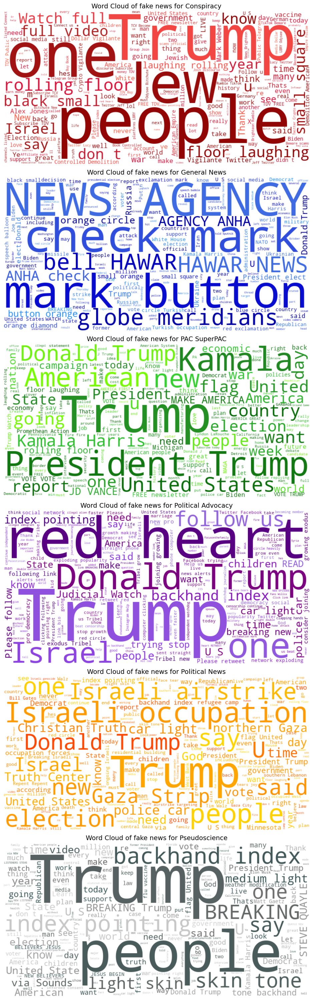

In [ ]:
dark_reds = LinearSegmentedColormap.from_list('dark_reds', ['#8B0000', '#B22222', '#DC143C', '#FF6347'])
dark_blues = LinearSegmentedColormap.from_list('dark_blues', ['#00008B', '#0000CD', '#4169E1', '#1E90FF'])
dark_greens = LinearSegmentedColormap.from_list('dark_greens', ['#006400', '#228B22', '#32CD32', '#7FFF00'])
dark_purples = LinearSegmentedColormap.from_list('dark_purples', ['#4B0082', '#800080', '#8A2BE2', '#9370DB'])
dark_oranges = LinearSegmentedColormap.from_list('dark_oranges', ['#FF4500', '#FF8C00', '#FFA500', '#FFD700'])
dark_greys = LinearSegmentedColormap.from_list('dark_greys', ['#2F4F4F', '#696969', '#A9A9A9', '#D3D3D3'])

colormaps = [dark_reds, dark_blues, dark_greens, dark_purples, dark_oranges, dark_greys]

categories = df_filtred_fake.groupby('categoria')

num_categories = len(categories)

fig, axes = plt.subplots(num_categories, 1, figsize=(10, 5 * num_categories))

for (category, group), ax, colormap in zip(categories, axes, colormaps):
    text = ' '.join(group['text_clean_sw'].dropna().astype(str))

    wordcloud = WordCloud(width=800, height=400, background_color='white', colormap=colormap).generate(text)
    ax.imshow(wordcloud, interpolation='bilinear')
    ax.set_title(f'Word Cloud of fake news for {category}', fontsize=14)
    ax.axis('off')

plt.tight_layout()
plt.show()

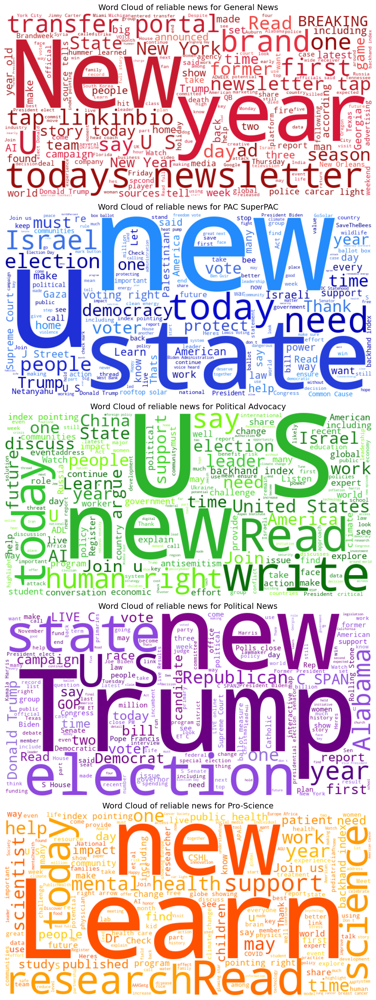

In [ ]:
dark_reds = LinearSegmentedColormap.from_list('dark_reds', ['#8B0000', '#B22222', '#DC143C', '#FF6347'])
dark_blues = LinearSegmentedColormap.from_list('dark_blues', ['#00008B', '#0000CD', '#4169E1', '#1E90FF'])
dark_greens = LinearSegmentedColormap.from_list('dark_greens', ['#006400', '#228B22', '#32CD32', '#7FFF00'])
dark_purples = LinearSegmentedColormap.from_list('dark_purples', ['#4B0082', '#800080', '#8A2BE2', '#9370DB'])
dark_oranges = LinearSegmentedColormap.from_list('dark_oranges', ['#FF4500', '#FF8C00', '#FFA500', '#FFD700'])
dark_greys = LinearSegmentedColormap.from_list('dark_greys', ['#2F4F4F', '#696969', '#A9A9A9', '#D3D3D3'])

colormaps = [dark_reds, dark_blues, dark_greens, dark_purples, dark_oranges, dark_greys]

categories = df_filtred_true.groupby('categoria')

num_categories = len(categories)

fig, axes = plt.subplots(num_categories, 1, figsize=(10, 5 * num_categories))

for (category, group), ax, colormap in zip(categories, axes, colormaps):
    text = ' '.join(group['text_clean_sw'].dropna().astype(str))
    
    wordcloud = WordCloud(width=800, height=400, background_color='white', colormap=colormap).generate(text)
    
    ax.imshow(wordcloud, interpolation='bilinear')
    ax.set_title(f'Word Cloud of reliable news for {category}', fontsize=14)
    ax.axis('off')

plt.tight_layout()
plt.show()

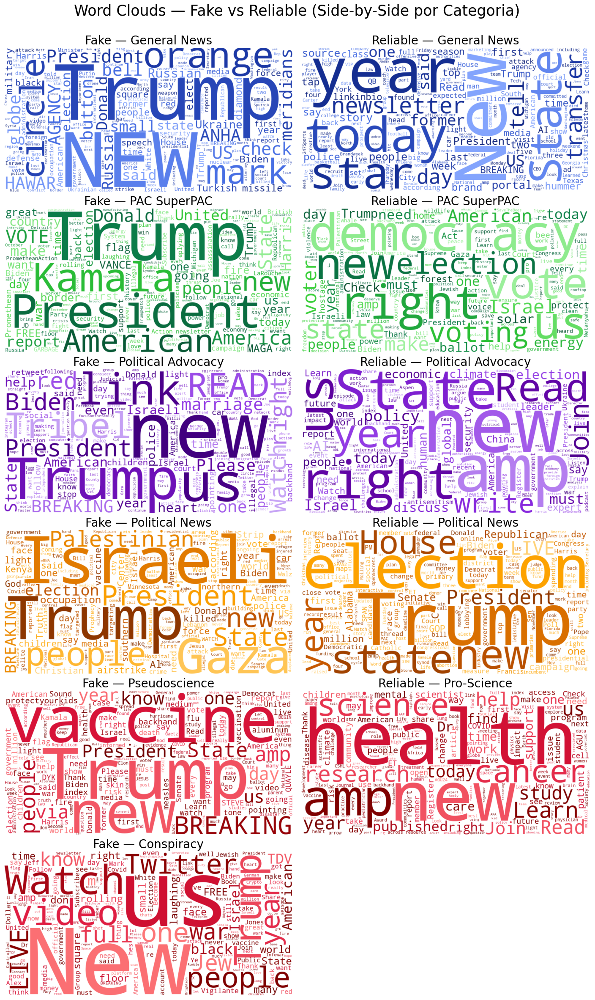

In [ ]:
# ===== 1) Consistent palette by category =====
# Keeps the same color “family” for the same category in fake and true
cmap_by_category = {
    "General News": LinearSegmentedColormap.from_list('gn_blues', ['#0B1E73', '#1D39A7', '#4169E1', '#88A8FF']),
    "PAC SuperPAC": LinearSegmentedColormap.from_list('pac_greens', ['#084c2e', '#0b7d49', '#32CD32', '#A7F3A7']),
    "Political Advocacy": LinearSegmentedColormap.from_list('adv_purples', ['#3D007A', '#5C009E', '#8A2BE2', '#C7A4F5']),
    "Political News": LinearSegmentedColormap.from_list('pol_oranges', ['#8A3400', '#CC5C00', '#FFA500', '#FFD37A']),
    "Pseudoscience": LinearSegmentedColormap.from_list('consp_reds', ['#6F0000', '#8B0000', '#DC143C', '#FF7A7A']),
    "Conspiracy": LinearSegmentedColormap.from_list('consp_reds', ['#6F0000', '#8B0000', '#DC143C', '#FF7A7A']),
    # Reliable pair of Pseudoscience:
    "Pro-Science": LinearSegmentedColormap.from_list('consp_reds', ['#6F0000', '#8B0000', '#DC143C', '#FF7A7A']),
}

# ===== 2) Fixed row order =====
ROW_ORDER = [
    "General News",
    "PAC SuperPAC",
    "Political Advocacy",
    "Political News",
    "Pseudoscience",
    "Conspiracy",
]

# ===== 3) Mapping of Fake -> True pairs =====
# For Pseudoscience, the pair is Pro-Science. For Conspiracy, there is no direct equivalent.
TRUE_PAIR = {
    "General News": "General News",
    "PAC SuperPAC": "PAC SuperPAC",
    "Political Advocacy": "Political Advocacy",
    "Political News": "Political News",
    "Pseudoscience": "Pro-Science",
    "Conspiracy": None,  # no reliable pair
}

# ===== 4) Helper function to generate text by category =====
def concat_text(df, category_col, text_col, category_name):
    if category_name is None:
        return ""
    sub = df.loc[df[category_col] == category_name, text_col].dropna().astype(str)
    text = " ".join(sub.tolist())
    # Remove isolated "u", "s", or "t" (uppercase or lowercase)
    text = re.sub(r"\bu\b", "", text, flags=re.IGNORECASE)
    text = re.sub(r"\bs\b", "", text, flags=re.IGNORECASE)
    text = re.sub(r"\bt\b", "", text, flags=re.IGNORECASE)
    return text

# ===== 5) Side-by-side grid generation =====
def plot_side_by_side_wordclouds(
    df_fake: pd.DataFrame,
    df_true: pd.DataFrame,
    category_col: str = "categoria",
    text_col: str = "text_clean_sw",
    row_order=ROW_ORDER,
    true_pair=TRUE_PAIR,
    cmap_map=cmap_by_category,
    width=900, height=450
):
    nrows = len(row_order)
    fig, axes = plt.subplots(
        nrows=nrows, ncols=2,
        figsize=(14, 3.8*nrows),
        constrained_layout=True
    )

    for i, fake_cat in enumerate(row_order):
        # Left: Fake
        ax_left = axes[i, 0]
        fake_text = concat_text(df_fake, category_col, text_col, fake_cat)

        if fake_text.strip():
            wc = WordCloud(
                width=width, height=height,
                background_color="white",
                colormap=cmap_map.get(fake_cat, "viridis"),
                collocations=False
            ).generate(fake_text)
            ax_left.imshow(wc, interpolation="bilinear")
            ax_left.set_title(f"Fake — {fake_cat}", fontsize=20)
        else:
            ax_left.text(0.5, 0.5, f"No data\n{fake_cat} (Fake)",
                         ha="center", va="center", fontsize=12)
        ax_left.axis("off")

        # Right: True (equivalent pair)
        true_cat = true_pair.get(fake_cat, None)
        ax_right = axes[i, 1]
        # if true_cat is None:
        #     # No reliable pair
        #     ax_right.text(0.5, 0.5, "No equivalent category\n(Reliable)",
        #                   ha="center", va="center", fontsize=12)
        #     ax_right.axis("off")
        #     continue

        true_text = concat_text(df_true, category_col, text_col, true_cat)
        if true_text.strip():
            # Use the same colormap if it’s the SAME category, or the pair’s colormap (e.g., Pro-Science)
            cmap_key = true_cat if true_cat in cmap_map else fake_cat
            wc_t = WordCloud(
                width=width, height=height,
                background_color="white",
                colormap=cmap_map.get(cmap_key, "viridis"),
                collocations=False
            ).generate(true_text)
            ax_right.imshow(wc_t, interpolation="bilinear")
            ax_right.set_title(f"Reliable — {true_cat}", fontsize=20)
        # else:
        #     ax_right.text(0.5, 0.5, f"No data\n{true_cat} (Reliable)",
        #                   ha="center", va="center", fontsize=12)
        ax_right.axis("off")

    # Column titles
    axes[0, 0].set_xlabel("Fake", fontsize=0)     # reserve space only
    axes[0, 1].set_xlabel("Reliable", fontsize=0) # same
    fig.suptitle("Word Clouds — Fake vs Reliable (Side-by-Side by Category)", fontsize=25, y=1.03)
    plt.show()

# ===== 6) Function call =====
plot_side_by_side_wordclouds(
    df_fake=df_filtred_fake,
    df_true=df_filtred_true,
    category_col="categoria",
    text_col="text_clean_sw"
)
